<a href="https://colab.research.google.com/github/SatyamPawale/COMPUTER-VISION/blob/main/exercise_5.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Exercise 5: Random Forests

**Note**: Please insert the names of all participating students:

1.
2.
3.
4.
5.

In [1]:
import sys, os
if 'google.colab' in sys.modules:
  if os.getcwd() == '/content':
    !git clone 'https://github.com/inb-luebeck/cs5450.git'
    os.chdir('cs5450')

Cloning into 'cs5450'...
remote: Enumerating objects: 130, done.
remote: Counting objects: 100% (69/69), done.
remote: Compressing objects: 100% (52/52), done.
remote: Total 130 (delta 40), reused 38 (delta 17), pack-reused 61 (from 1)
Receiving objects: 100% (130/130), 28.17 MiB | 30.02 MiB/s, done.
Resolving deltas: 100% (67/67), done.


In this exercise, we will use the random forest algorithm to combine multiple decision trees to one strong classifier for a multi-class classification problem on a two-dimensional dataset. The individual trees of the random forest differ because they are trained with a random subset of (i) features — in this exercise a single feature of the two-dimensional dataset
— and (ii) training data. The latter is done by applying the technique of *bootstrap aggregating (bagging)*. Given a dataset $D$ of size n, bagging generates m new training sets $D_i$ , each of size n, by sampling from $D$ uniformly and with replacement. Note
that by sampling with replacement, some observations may be repeated in $D_i$ and some observations are not used at all. They are called *out-of-bag (oob) observations* and can
be used for testing.

We will build on the code which we have provided here. You only need to write code at the places indicated by TODO in the files.
Implement the missing parts in this file. When done correctly, your code should do the following:

1. Create a random dataset.

2. Iterativly, do the following:
    - Randomly select a single feature.
    - Randomly generate a bootstrapped training set.
    - Train a decision tree on the bootstrapped set with a single feature
    - Generate a test set using the out-of-bag samples.
    - Compute the posterior probabilities of the test set.
    - Combine the out-of-bag posterior probabilities over the forest to obtain a prediction for each sample of the complete dataset.
    - Calculate the out-of-bag error of the random forest.
    - Visualize the data and the decision boundaries of the random forest.

3. Plot the out-of-bag error of the random forest for each iteration.

4. Good initial values are: `n_samples=500`, `n_classes=5`, `n_trees=100`, `n_splits=4`, `seed=20`.

You can visualize a decision tree with the function `some_tree.plot_tree`

Helpful Documentation:
- [DecisionTreeClassifier](https://scikit-learn.org/stable/modules/generated/sklearn.tree.DecisionTreeClassifier.html)
- [python sets](https://docs.python.org/2/library/sets.html)
- [random integers](https://docs.scipy.org/doc/numpy-1.15.0/reference/generated/numpy.random.randint.html)

In [2]:
import numpy as np
import random
from sklearn import tree as scikit_tree
import matplotlib.pyplot as plt
from IPython.display import HTML
from matplotlib.animation import FuncAnimation


In [13]:
#######################################################
#################### DATA #############################
#######################################################

def gen_data(n_samples, n_classes):
 # Create a 2D multi-class dataset with clearly separated clusters.
 # Randomly create n_classes cluster centers in 2D
 # Assign an equal number of samples to each class
 # Add Gaussian noise around each class center
    """
     GENDATA Generate data and its labels.

     INPUT:
       n_samples : number of samples (observations)
       n_classes : number of distinct classes

     OUTPUT:
       data : two-dimensional data points
       labels : multi-class labels (i.e. 1, 2, 3, ...) of the data points
    """

    center = np.random.rand(n_classes, 2)
    data = np.random.rand(n_samples, 2)
    labels = np.ones(n_samples)
    n_samples_per_class = int(n_samples / n_classes)

    for i in range(n_classes):
        r = np.random.randn(n_samples_per_class, 2) / 12.
        b = i * n_samples_per_class
        e = (i+1)*n_samples_per_class
        data[b:e, :] = center[i, :] + r
        labels[b:e] = i

    return data, labels

    # data: shape (n_samples, 2)
    # labels: integer class labels {0, 1, ..., n_classes-1}
    # This gives us a non-linear classification problem, perfect for decision trees.

In [4]:
#######################################################
################ VISUALIZATION ########################
#######################################################

def get_decision_boundary(data, labels, trees_):
  # Visualize how the random forest classifies the 2D space.
    xrange = [data[:,0].min(), data[:,0].max()]
    yrange = [data[:,1].min(), data[:,1].max()] #Create a dense grid over the feature space
    inc = 0.01;
    x, y = np.meshgrid(np.arange(xrange[0], xrange[1],inc), np.arange(yrange[0], yrange[1],inc));
    image_shape = x.shape;
    xy = np.stack([x.flatten(), y.flatten()],-1);
    # For each grid point:
    # Each tree predicts class probabilities
    # Only its chosen feature is used to make a decision.

    n_samples = x.size #numel(x);
    n_classes = (np.unique(labels)).shape[0];
    # Average probabilities across all trees
    predictions = np.zeros((n_samples, n_classes))
    for tree in trees_:
        random_feature = tree.feature
        s = tree.predict_proba(xy[:, random_feature])
        predictions = predictions + s;
    # Select the class with highest probability
    predictions = predictions / float(len(trees_));
    c = predictions.argmax(1)
    a = predictions.max(1).reshape(image_shape)

    c = c.reshape(image_shape)
    return c
    #This shows how many weak learners combine into a strong classifier.

class Animation(object):
    """
    Creates animation object to visualize the decision boundaries of the strong classifier.
    """
    def __init__(self, data, labels, decision_boundaries):
        """
        INPUT:
            data : 2D data points
            labels : ndarray of class labels with integer values -1 or 1
            decision_boundaries: ndarray of shape (n_classifiers, n**2) with prediction results for an (n x n) grid.
        """
        super().__init__()
        self.decision_boundaries = decision_boundaries
        #Animate the learning process as trees are added.

        fig, ax = plt.subplots(figsize=(12, 8))

        xrange = [data[:,0].min(), data[:,0].max()]
        yrange = [data[:,1].min(), data[:,1].max()]
        cmap = plt.cm.get_cmap('jet',lut=n_classes)

        for i in range(n_classes):
            tmp = data[labels==i,:]
            plt.scatter(*tmp.T, marker='d',color=cmap(i), s=150, edgecolor='k')
        # Each frame corresponds to a larger forest
        # You can see the decision boundary becoming smoother and more accurate
        im = ax.imshow(decision_boundaries[0], extent=xrange + yrange,
                       interpolation='none', cmap='jet', origin='lower',
                       vmin=0, vmax=n_classes-1,
                       alpha=.7)

        self.fig = fig
        self.im = im

    def animate(self, i):
        """
        animate function for FuncAnimation

        Input:
            i : integer for indexing
        """
        self.im.set_array(self.decision_boundaries[i])

    def get_animation(self):
        """
        Return animation object which holds the animation
        """
        return FuncAnimation(self.fig, self.animate, frames=len(self.decision_boundaries))


In [5]:
#######################################################
################ CLASSIFIER ###########################
#######################################################
# Why not use sklearn trees directly? Because each tree:
# Uses only one feature
# Needs to remember which feature it used
class MyTree():
    def __init__(self, tree, feature):
        self.clf = tree
        self.feature = feature

    def predict_proba(self, x):
        assert x.ndim == 1
        x = x.reshape(x.shape[0], 1)
        return self.clf.predict_proba(x)

    def predict(self, x):
        return self.clf.predict(x)

    def plot_tree(self):
        scikit_tree.plot_tree(self.clf)

# `clf` :trained sklearn decision tree
# `feature`:  selected feature index (0 or 1)


def train_tree(data, labels, feature, n_splits):
    """
     TRAINTREE Train a single decision tree.

     INPUT:
       data : one-dimensional data points
       labels : multi-class labels of the data points
       feature : the randomly selected feature (i.e. 1 or 2)
       n_splits : maximum depth

     OUTPUT:
       tree : trained decision tree
    """
    assert data.ndim == 1,'After random feature selection, trainData must be single-column'
    data = data.reshape((data.shape[0], 1))

    tree = scikit_tree.DecisionTreeClassifier(max_depth=n_splits, criterion='entropy')
    tree = tree.fit(data, labels)

    return MyTree(tree, feature)
#tree = fitctree(data, labels, 'MaxNumSplits', nSplits, 'SplitCriterion', 'deviance', 'PredictorNames', int2str(feature));
#Prediction
#Visualization
#Aggregation

In [6]:
## Define variables

# TODO nSamples : number of samples (observations)
n_samples = 500;

# TODO nClasses : number of classes
n_classes = 5;

# TODO nTrees : number of trees
n_trees = 100;

# TODO nSplits : maximum number of decision splits of the tree
n_splits = 3;

# TODO seed : set seed for reproducable results
seed = 20;

#rng(seed);
random.seed(seed)
np.random.seed(seed)

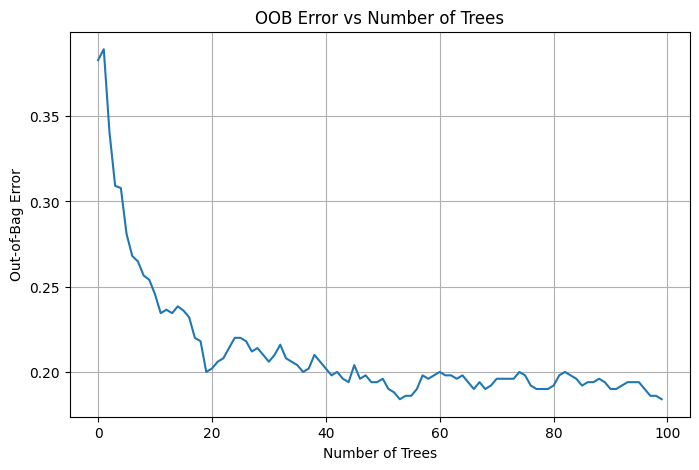

In [16]:
## Train, combine, and visualize multiple decision trees

# TODO generate data (help genData)
# Generate the synthetic dataset once before training begins.
# The data consists of 2D points grouped into multiple classes.
data, labels = gen_data(n_samples, n_classes)


trees_ = list()
posterior = np.zeros((n_samples, n_trees, n_classes))
errors = list()
decision_boundaries = []

# Initialize containers that will be updated as trees are added.
# Trees are stored for later aggregation and visualization.
# Posterior probabilities are stored for out-of-bag evaluation.
# Errors track how the ensemble performance evolves.
# Decision boundaries are stored for animation.


for t in range(n_trees):

    # TODO select a random feature (i.e. 1 or 2) of the two-dimensional dataset
    # Randomly select exactly one feature out of the two available features.
    # This introduces randomness and reduces correlation between trees.
    feature = random.randint(0, 1)


    # TODO randomly sample 'n_samples' data points and its labels with replacement
    # This is called bootstrap aggregating (bagging)
    # Create a bootstrap sample by randomly drawing indices with replacement.
    # Each tree is trained on a slightly different dataset.
    # Some samples may appear multiple times while others are not selected at all.
    train_idx = np.random.randint(0, n_samples, n_samples)
    train_data = data[train_idx, feature]
    train_labels = labels[train_idx]


    # TODO train the decision tree (train_tree)
    # Train a shallow decision tree using only the selected feature.
    # Each tree acts as a weak learner in the ensemble.
    tree_ = train_tree(train_data, train_labels, feature, n_splits)
    trees_.append(tree_)


    # TODO use the remaining samples to test the tree (set difference)
    # These are called out-of-bag (oob) observations
    # Identify the samples that were not included in the bootstrap sample.
    # These out-of-bag samples will be used for unbiased evaluation.
    test_idx = np.setdiff1d(np.arange(n_samples), train_idx)
    test_data = data[test_idx, feature]


    # TODO compute the oob posterior probabilities
    # (see MyTree & scikit DecisionTreeClassifier)
    # Predict class probabilities for the out-of-bag samples.
    # Probabilities are stored for later aggregation across trees.
    scores = tree_.predict_proba(test_data)
    posterior[test_idx, t, :] = scores


    # TODO compute the class predictions of the random forest (so far)
    # Combine the predictions of all trees trained so far.
    # Posterior probabilities are averaged and the most likely class is chosen.
    mean_post = posterior.mean(axis=1)
    predictions = mean_post.argmax(axis=1)


    # TODO compute the oob error of the random forest (so far)
    # Compute the out-of-bag error using only samples that were evaluated
    # by at least one tree as out-of-bag.
    oob_mask = posterior.sum(axis=(1, 2)) > 0
    error = np.mean(predictions[oob_mask] != labels[oob_mask])
    errors.append(error)


    # TODO visualize the data and the current decision boundaries (help showData)
    # Compute and store the current decision boundary of the forest.
    # This allows visualization of how the classifier improves over time.
    decision_boundaries.append(
        get_decision_boundary(data, labels, trees_)
    )


# TODO plot the oob error of the random forest for each iteration
# Plot the out-of-bag error as a function of the number of trees.
# This shows how the ensemble converges as more trees are added.
plt.figure(figsize=(8, 5))
plt.plot(errors)
plt.xlabel("Number of Trees")
plt.ylabel("Out-of-Bag Error")
plt.title("OOB Error vs Number of Trees")
plt.grid(True)
plt.show()


In [ ]:
# This plot shows how the out-of-bag (OOB) error changes as more trees are added.
# Initially, the error is high because only a few weak trees are available.
# As the number of trees increases, the error drops rapidly due to variance reduction.
# After around 40–60 trees, the error stabilizes, indicating convergence.
# Small oscillations are expected because different trees see different OOB samples.
# The plateau shows that adding more trees beyond this point yields diminishing returns.
# This confirms that the random forest generalizes well without overfitting.


/tmp/ipython-input-3740193637.py:48: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  cmap = plt.cm.get_cmap('jet',lut=n_classes)


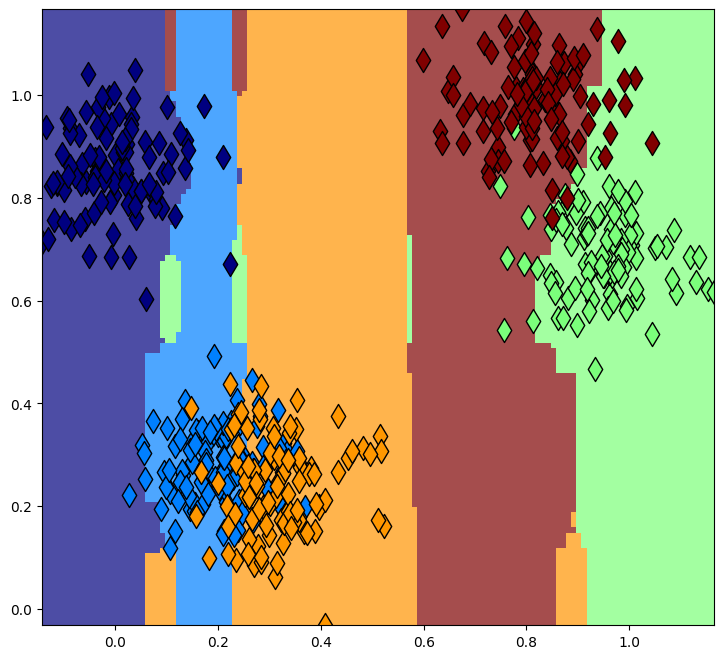

In [9]:
animation = Animation(data, labels, decision_boundaries)
HTML(animation.get_animation().to_jshtml())

In [ ]:
# This figure visualizes the decision boundary learned by the random forest.
# Each colored region corresponds to the predicted class of the ensemble.
# The diamond markers represent the training samples.
# The decision boundaries appear blocky and mostly axis-aligned.
# This is because each individual tree uses only one feature for splitting.
# Although each tree is weak, their aggregated predictions form meaningful regions.
# Most data points fall inside correctly classified regions, showing good performance.
# The visualization demonstrates how multiple weak learners combine into a strong classifier.


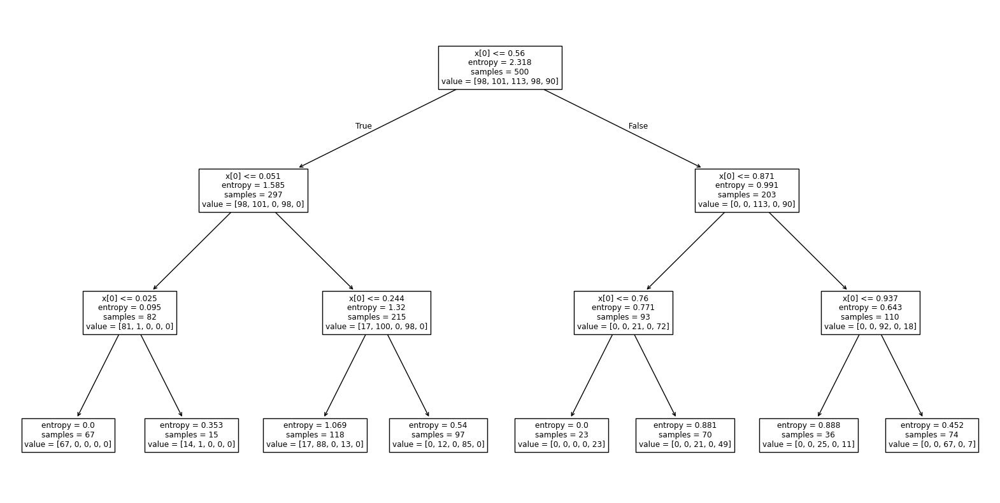

In [12]:
# TODO: plot one of the trees
plt.figure(figsize=(20, 10))
trees_[0].plot_tree()
plt.show()

In [ ]:
# This figure shows the structure of a single decision tree from the random forest.
# Each internal node represents a split based on a threshold of one feature.
# Entropy indicates the impurity of the node; lower entropy means purer class distribution.
# The 'samples' value shows how many training points reach that node.
# The 'value' vector shows the number of samples from each class at that node.
# The tree is shallow and uses only one feature, making it a weak classifier.
# Many leaf nodes still contain mixed classes, indicating limited predictive power.
# This weakness is intentional, as random forests rely on many such trees for accuracy.


1. Unlike a SVM, a decision tree is intrinsically suited for a multi-class problem.

[Your answer]

2. A decision tree cannot be used for regression.

[Your answer]

3. Pure nodes of a decision tree (i.e. only a single class is present) have a high entropy.

[Your answer]

4. A decision stump (a one-level decision tree) is prone to overfitting.

[Your answer]

5. Pruning a decision tree can be useful to avoid overfitting.

[Your answer]

6. Each decision tree in a random forest is identical.

[Your answer]

7. The expected fraction of unique observations in a bootstrap dataset is approximately $63.2 \%$.

[Your answer]

8. The out-of-bag error estimates the generalization error of the random forest.

[Your answer]

9. A random forest can be both trained and tested in parallel.

[Your answer]